<a href="https://colab.research.google.com/github/Rehana001/Tensorflow_callback/blob/main/image_generator_no_validation_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!gdown --id 1onaG42NZft3wCE1WH0GDEbUhu75fedP5

Downloading...
From: https://drive.google.com/uc?id=1onaG42NZft3wCE1WH0GDEbUhu75fedP5
To: /content/horse-or-human.zip
150MB [00:01, 91.7MB/s]


the following code consist of OS library to use operating system libraries and give you access to the file system and zip file library allowing you to unzip the data 

In [2]:
import os 
import zipfile 
local_zip='./horse-or-human.zip'
zip_ref=zipfile.ZipFile(local_zip,'r')
zip_ref.extractall('./horse-or-human')
zip_ref.close()

the content of .zip is extracted to the base directory which contains humans and horses subdirectories 
nw lets define each of its directories 

In [3]:
#directory of training horse pictures 
train_horse_dr=os.path.join('./horse-or-human/horses')

#directory with our training human pictures 
train_human_dr= os.path.join('./horse-or-human/horses')


now lets name the filenames to the human and horse directories 

In [4]:
train_horse_names= os.listdir(train_horse_dr)
print(train_horse_names[:10])

train_human_names= os.listdir(train_human_dr)
print(train_human_names[:10])

['horse31-5.png', 'horse35-8.png', 'horse40-8.png', 'horse50-8.png', 'horse40-3.png', 'horse38-8.png', 'horse11-9.png', 'horse43-7.png', 'horse39-1.png', 'horse01-2.png']
['horse31-5.png', 'horse35-8.png', 'horse40-8.png', 'horse50-8.png', 'horse40-3.png', 'horse38-8.png', 'horse11-9.png', 'horse43-7.png', 'horse39-1.png', 'horse01-2.png']


lets find out the total numbee of human and horse images in directory 

In [5]:
print('total training horse images',len(os.listdir(train_horse_dr)))
print('total training human images',len(os.listdir(train_human_dr)))

total training horse images 500
total training human images 500


now lets take of look of some images to understand how they look like. first configure matplotlib library 

In [6]:
%matplotlib inline 

import matplotlib.pyplot as plt 
import matplotlib.image as mpimg

#parameters of images to be displayed as a graph 
ncols=4
nrows=4

#index of iterating over image 
pic_index=0

now we will display 8 horses and 8 humans pictures 

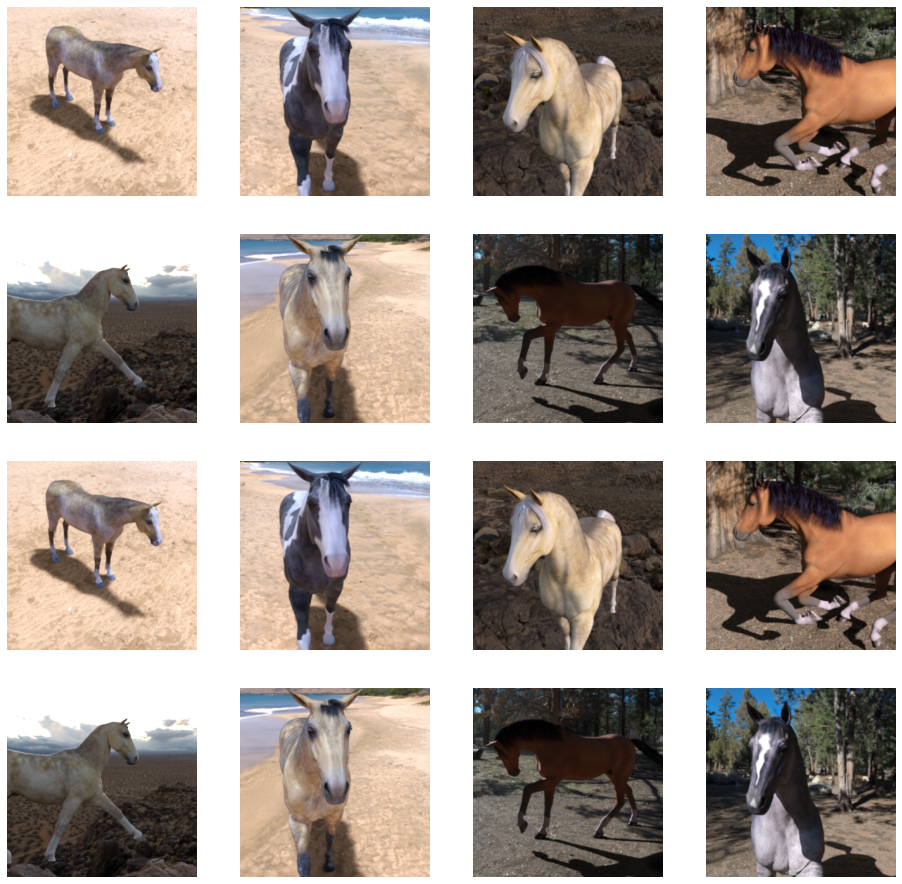

In [7]:
fig=plt.gcf()
fig.set_size_inches(ncols * 4 , nrows * 4)

pic_index +=8
next_horse_pix=[os.path.join(train_horse_dr,fname)
                for fname in train_horse_names[pic_index-8:pic_index]]
next_human_pix=[os.path.join(train_human_dr,fname)
                for fname in train_human_names[pic_index-8:pic_index]]

for i,img_path in enumerate(next_horse_pix+next_human_pix):
  #setting up subplots whose indices starts at one 
  sp=plt.subplot(nrows,ncols,i+1)
  sp.axis('Off') #dont show access or grid lines 
  
  img=mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

# **BUILDING A SMALL MODEL FROM SCRATCH **

but before we continue lets start defining the model 

In [8]:
!pip install -U tensorflow==2.5.0

     |████████████████████████████████| 454.3 MB 16 kB/s 
     |████████████████████████████████| 1.2 MB 38.0 MB/s 
     |████████████████████████████████| 462 kB 73.2 MB/s 
     |████████████████████████████████| 4.0 MB 21.8 MB/s 
  Attempting uninstall: grpcio
    Found existing installation: grpcio 1.39.0
    Uninstalling grpcio-1.39.0:
      Successfully uninstalled grpcio-1.39.0
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.6.0
    Uninstalling tensorflow-estimator-2.6.0:
      Successfully uninstalled tensorflow-estimator-2.6.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.6.0
    Uninstalling tensorflow-2.6.0:
      Successfully uninstalled tensorflow-2.6.0


In [9]:
import tensorflow as tf 

In [10]:
model = tf.keras.models.Sequential([
      #note the input shape of desired size of image 300x300 with 3 bytes color
      #This is first convolution 
      tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(300,300,3)),
      tf.keras.layers.MaxPooling2D(2,2),
      #The second convolution 
      tf.keras.layers.Conv2D(32,(3,3), activation='relu'),
      tf.keras.layers.MaxPooling2D(2,2),
      #The third convolution 
      tf.keras.layers.Conv2D(64,(3,3), activation='relu'),
      tf.keras.layers.MaxPool2D(2,2),
      #The fourth Convolution 
      tf.keras.layers.Conv2D(64,(3,3), activation='relu'),
      tf.keras.layers.MaxPooling2D(2,2),
      #The fifth Convolution 
      tf.keras.layers.Conv2D(64,(3,3) , activation='relu'),
      tf.keras.layers.MaxPooling2D(2,2),
      #Flatten the results to feed into DNN
      tf.keras.layers.Flatten(),
      #512 neuron hidden layer
      tf.keras.layers.Dense(512, activation='relu'),
      # only one output neuron It will contain a value from 0-1 where 0 for 1 class ('horses') and 1 for the other ('humans')
      tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 298, 298, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 149, 149, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 147, 147, 32)      4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 73, 73, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 71, 71, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 35, 35, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 33, 33, 64)        3

In [11]:
from tensorflow.keras.optimizers import RMSprop

model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(learning_rate=0.001),
              metrics=['accuracy'])

# DATA PROCESSING 

lets setup the data generators that will read pictures in our source folders , convert them to float32 tensors, and feed them (with their labels) to our network. we will have one generator for the training images and one for validation images our generators will yeild the batches of images of size 300x300

In [12]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen= ImageDataGenerator(rescale=1/255)

#flow training images in batches of 128 using train_datagen generator 
train_generator= train_datagen.flow_from_directory(
    './horse-or-human/', #source directory for training images 
      target_size=(300,300), #All images will be resized to 150x150
      batch_size=128,
      #since we use binary crossentropy loss, we need binary labels 
      class_mode='binary')

Found 1027 images belonging to 2 classes.


# Training 

now lets train the model with 15 epochs 

In [13]:
history = model.fit(
      train_generator,
      steps_per_epoch=8,  
      epochs=15,
      verbose=1)

Epoch 1/15
8/8 [==============================] - 92s 11s/step - loss: 0.8714 - accuracy: 0.5907
Epoch 2/15
8/8 [==============================] - 85s 10s/step - loss: 0.6937 - accuracy: 0.7052
Epoch 3/15
8/8 [==============================] - 95s 12s/step - loss: 0.8199 - accuracy: 0.8467
Epoch 4/15
8/8 [==============================] - 85s 10s/step - loss: 0.2843 - accuracy: 0.9032
Epoch 5/15
8/8 [==============================] - 85s 10s/step - loss: 0.0861 - accuracy: 0.9689
Epoch 6/15
8/8 [==============================] - 85s 10s/step - loss: 0.4603 - accuracy: 0.8687
Epoch 7/15
8/8 [==============================] - 98s 12s/step - loss: 0.2435 - accuracy: 0.9150
Epoch 8/15
8/8 [==============================] - 91s 11s/step - loss: 0.0674 - accuracy: 0.9766
Epoch 9/15
8/8 [==============================] - 88s 12s/step - loss: 0.0321 - accuracy: 0.9911
Epoch 10/15
8/8 [==============================] - 87s 11s/step - loss: 0.1597 - accuracy: 0.9455
Epoch 11/15
8/8 [============

# Running a model

In [14]:
pip install -U keras==2.4.3

  Attempting uninstall: keras
    Found existing installation: keras 2.6.0
    Uninstalling keras-2.6.0:
      Successfully uninstalled keras-2.6.0


In [15]:
import numpy as np 
from google.colab import files 
from keras.preprocessing import image 

uploaded= files.upload()

for fn in uploaded.keys():
  #predicting images 
  path='/content/'+fn
  img=image.load_img(path,target_size=(300,300))
  x=image.img_to_array(img)
  x=np.expand_dims(x,axis=0)

  images=np.vstack([x])
  classes=model.predict(images,batch_size=10)
  print(classes[0])
  if classes[0]>0.5:
    print(fn+" is a human ")
  else:
      print(fn+" is a horse ")

Saving horse.jpg to horse.jpg
[0.]
horse.jpg is a horse 


# Visualizing intermediate representations 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


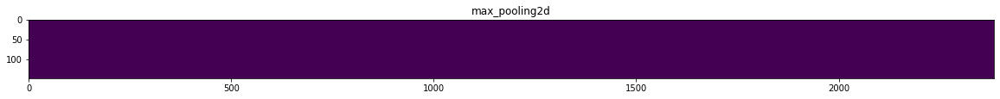

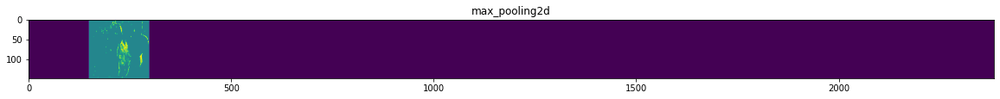

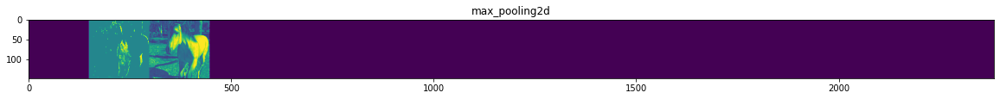

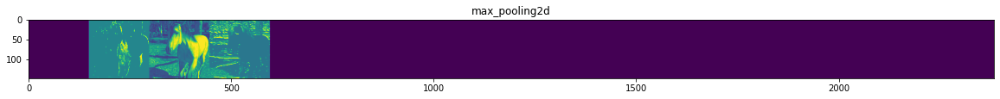

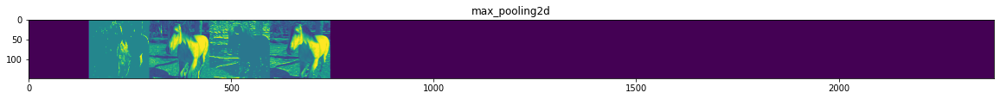

...

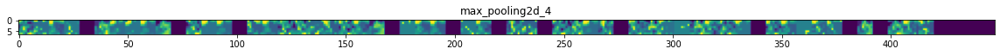

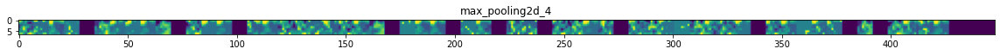

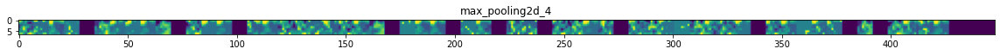

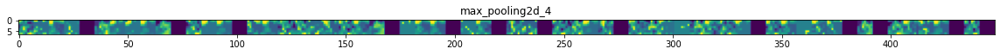

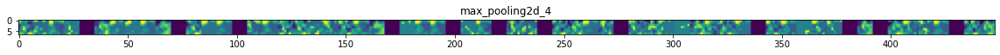

In [17]:
import numpy as np 
import random 
from tensorflow.keras.preprocessing.image import img_to_array, load_img

#lets define a new model that will take an image as input and will output 
#intermediate representation for all layers in the previous model after the first 
successive_output=[layer.output for layer in model.layers[1:]]
#visualization_model=model(img_input,successive_outputs)
visualization_model=tf.keras.models.Model(inputs= model.input,outputs=successive_output)
#lets prepare a random input image for a training set 
horse_img_files= [os.path.join(train_horse_dr,f) for f in train_horse_names]
human_img_files= [os.path.join(train_human_dr,f) for f in train_human_names]
img_path=random.choice(horse_img_files+human_img_files)

img=load_img(img_path,target_size=(300,300)) #this is a PIL image 
x= img_to_array(img) #numpy array with shape (150,150,3)
x= x.reshape((1,)+x.shape) #numpy array with shape(1,150,150,3)

#rescale with 1/255
x /=255

#now lets run image through network by obtaining all intermediate representations for this image 
successive_feature_maps=visualization_model.predict(x)

#these are the name of layers 
layer_names=[layer.name for layer in model.layers[1:]]

#now lets display our representations 
for layer_name, feature_map in zip(layer_names,successive_feature_maps):
  if len(feature_map.shape)==4:
    #just do this for conv/maxpool layers not fully connected layers 
    n_features= feature_map.shape[-1] #number of features in feature map 
    #the feature mao have shape(1,size,size,n_features)
    size=feature_map.shape[1]
    # we will tile our images in this matrix 
    display_grid= np.zeros((size, size*n_features))
    for i in range(n_features):
      #postprocess the features to make it visually portable 
      x= feature_map[0,:,:,i]
      x -= x.mean()
      x /=x.std()
      x *=64
      x +=128
      x =np.clip(x,0,255).astype('uint8')
      #we will tile each filter in each big horizontal grid
      display_grid[:, i * size : (i + 1) * size] = x
      #Display the grid 
      scale= 20./n_features
      plt.figure(figsize=(scale*n_features,scale))
      plt.title(layer_name)
      plt.grid(False)
      plt.imshow(display_grid, aspect='auto', cmap='viridis')

